In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2003


In [98]:
df = pd.read_csv('2003_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,0.39,0.93,1.24,0.95,1.05,1.22,0.83,0.75,1.00,1.13,0.88,0.89
1,1.0,0.52,1.00,1.27,1.01,1.01,1.13,0.87,0.93,1.12,1.25,1.09,1.10
2,1.5,0.65,1.08,1.31,1.07,0.99,1.08,0.92,1.10,1.24,1.38,1.29,1.30
3,2.0,0.77,1.16,1.36,1.15,1.01,1.06,0.99,1.26,1.35,1.49,1.46,1.47
4,2.5,0.89,1.25,1.42,1.23,1.05,1.08,1.09,1.40,1.47,1.61,1.61,1.61


In [5]:
df.describe()

,Matuarity,Jan,Feb,Mar,April,May,June,July,August,September,Oct,Nov,December
count,200.000000,200.000000,200.000000,200.000000,200.00000,200.000000,200.000000,200.00000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,50.250000,2.630750,2.737450,2.732350,2.63120,2.594000,2.574550,2.66940,2.865000,2.866600,2.998500,3.081250,3.168350
std,28.939592,0.499262,0.448098,0.431746,0.45426,0.501583,0.493196,0.45777,0.421908,0.422412,0.428895,0.441913,0.488949
min,0.500000,0.390000,0.930000,1.240000,0.95000,0.990000,1.060000,0.83000,0.750000,1.000000,1.130000,0.880000,0.890000
25%,25.375000,2.607500,2.677500,2.637500,2.53500,2.485000,2.457500,2.61750,2.840000,2.817500,2.937500,3.050000,3.110000
50%,50.250000,2.830000,2.930000,2.920000,2.83000,2.820000,2.800000,2.86000,3.025000,3.035000,3.180000,3.255000,3.365000
75%,75.125000,2.920000,3.020000,3.030000,2.94000,2.930000,2.910000,2.95000,3.110000,3.130000,3.270000,3.340000,3.472500
max,100.000000,2.970000,3.070000,3.080000,2.99000,2.990000,2.970000,3.00000,3.150000,3.180000,3.320000,3.390000,3.530000


In [6]:
df.cov()

,Matuarity,Jan,Feb,Mar,April,May,June,July,August,September,Oct,Nov,December
Matuarity,837.500000,10.964209,10.442651,10.554786,11.009070,12.239548,12.139837,10.507563,9.134874,9.757186,10.011231,9.783932,11.239410
Jan,10.964209,0.249262,0.222387,0.210730,0.222519,0.243509,0.237671,0.227780,0.210128,0.210204,0.212935,0.220225,0.243237
Feb,10.442651,0.222387,0.200792,0.192332,0.202772,0.222786,0.217968,0.204996,0.186695,0.188885,0.192039,0.196625,0.218414
Mar,10.554786,0.210730,0.192332,0.186405,0.196019,0.216342,0.212378,0.195788,0.176125,0.180277,0.183753,0.186269,0.208375
April,11.009070,0.222519,0.202772,0.196019,0.206352,0.227352,0.222913,0.206490,0.186270,0.190202,0.193854,0.196917,0.219892
May,12.239548,0.243509,0.222786,0.216342,0.227352,0.251586,0.247188,0.226699,0.202903,0.208268,0.212503,0.214831,0.240571
June,12.139837,0.237671,0.217968,0.212378,0.222913,0.247188,0.243242,0.221688,0.197644,0.203551,0.207740,0.209401,0.235042
July,10.507563,0.227780,0.204996,0.195788,0.206490,0.226699,0.221688,0.209553,0.191405,0.193080,0.196076,0.201254,0.223204
August,9.134874,0.210128,0.186695,0.176125,0.186270,0.202903,0.197644,0.191405,0.178006,0.177178,0.179204,0.186203,0.205168
September,9.757186,0.210204,0.188885,0.180277,0.190202,0.208268,0.203551,0.193080,0.177178,0.178432,0.181016,0.186155,0.206449


In [7]:
df.var()

Matuarity    837.500000
Jan            0.249262
Feb            0.200792
Mar            0.186405
April          0.206352
May            0.251586
June           0.243242
July           0.209553
August         0.178006
September      0.178432
Oct            0.183951
Nov            0.195287
December       0.239071
dtype: float64

In [73]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec,sum
0,0.5,0.39,0.93,1.24,0.95,1.05,1.22,0.83,0.75,1.00,1.13,0.88,0.89,1.876667
1,1.0,0.52,1.00,1.27,1.01,1.01,1.13,0.87,0.93,1.12,1.25,1.09,1.10,2.050000
2,1.5,0.65,1.08,1.31,1.07,0.99,1.08,0.92,1.10,1.24,1.38,1.29,1.30,2.235000
3,2.0,0.77,1.16,1.36,1.15,1.01,1.06,0.99,1.26,1.35,1.49,1.46,1.47,2.421667
4,2.5,0.89,1.25,1.42,1.23,1.05,1.08,1.09,1.40,1.47,1.61,1.61,1.61,2.618333


In [109]:
l = list(df.iloc[0,1:-1])
l

[0.39, 0.93, 1.24, 0.95, 1.05, 1.22, 0.83, 0.75, 1.0, 1.13, 0.88, 0.89]

In [100]:
name = df.columns[1:]

In [101]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [102]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

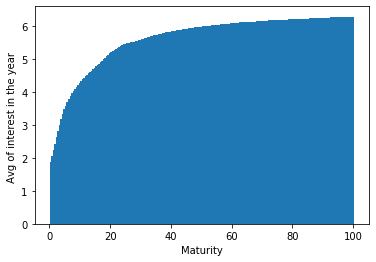

In [80]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

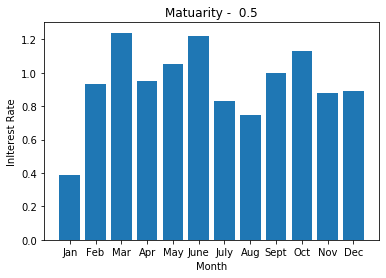

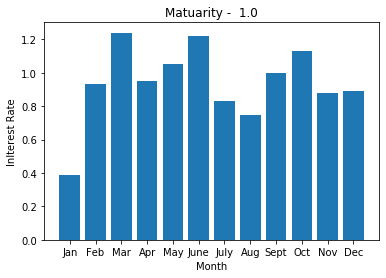

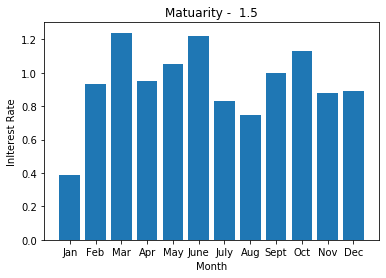

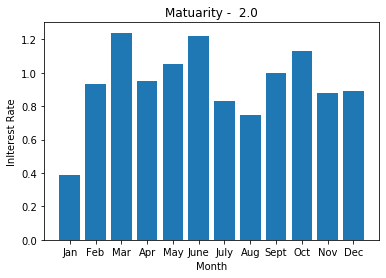

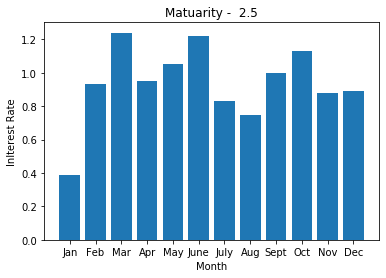

...

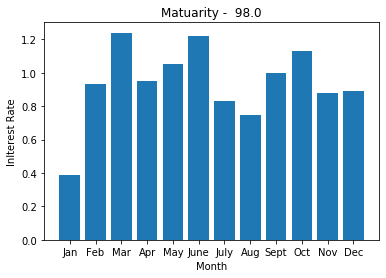

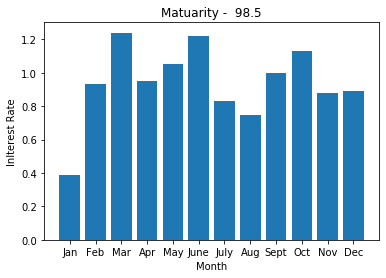

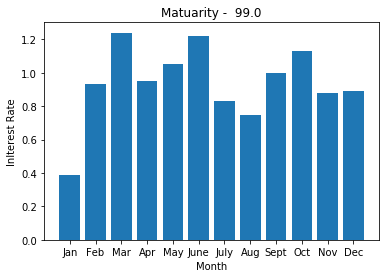

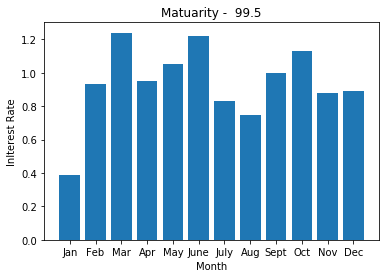

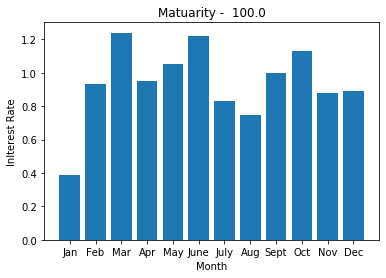

In [93]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

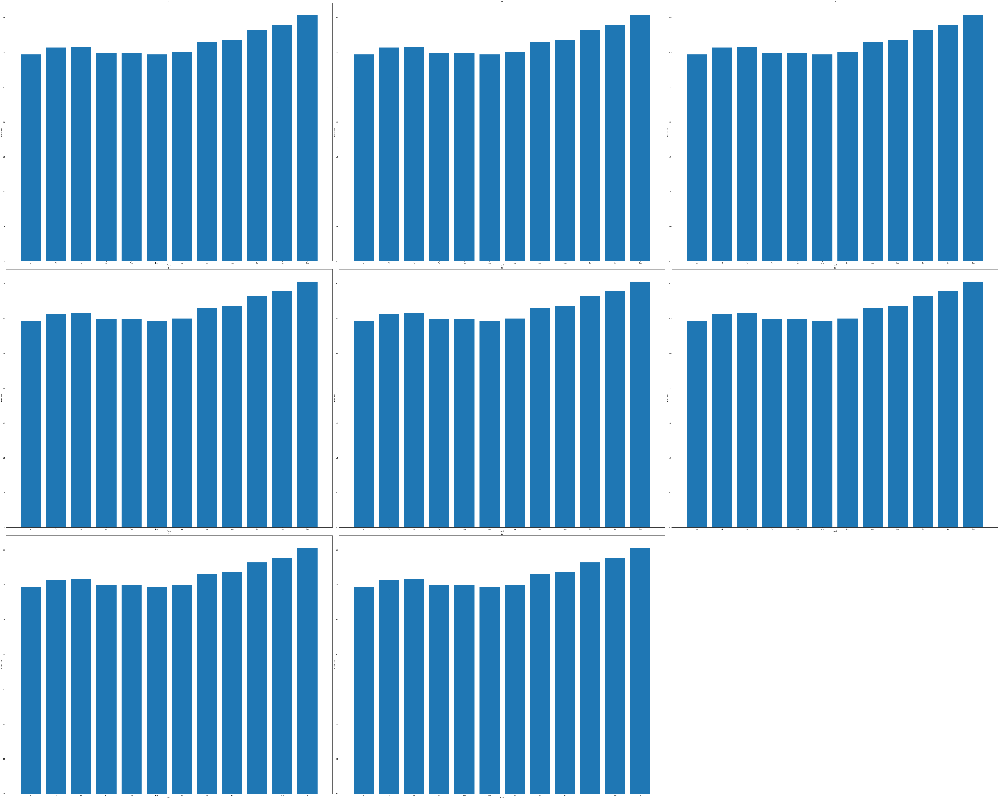

In [139]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

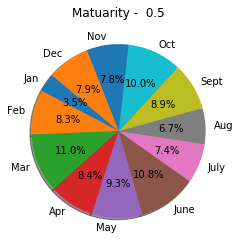

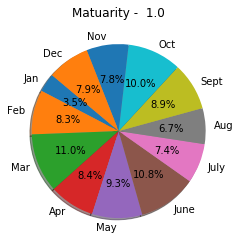

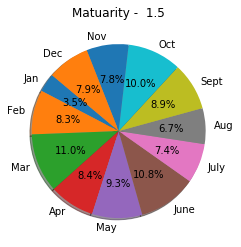

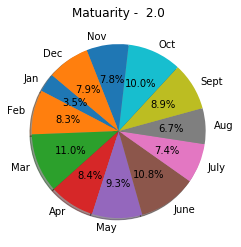

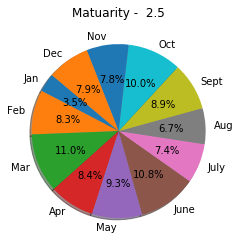

...

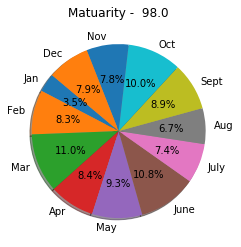

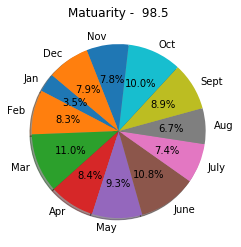

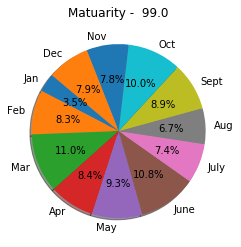

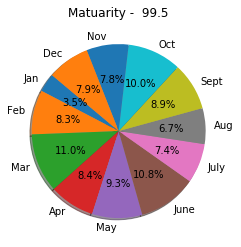

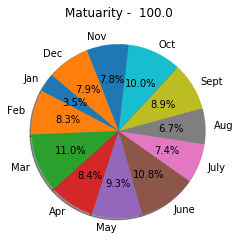

In [92]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

Saturation point hence recieved is : ---> 30 weeks

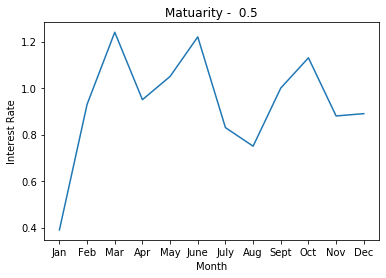

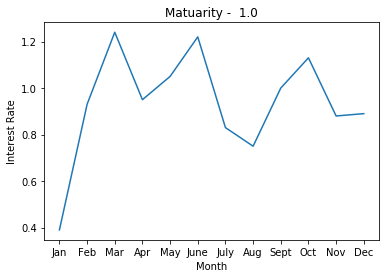

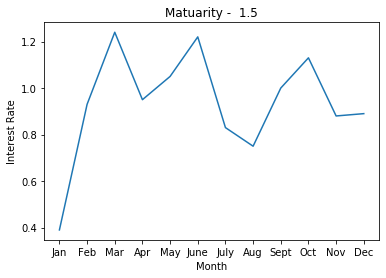

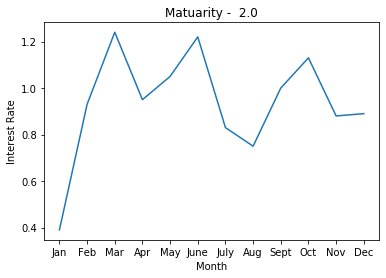

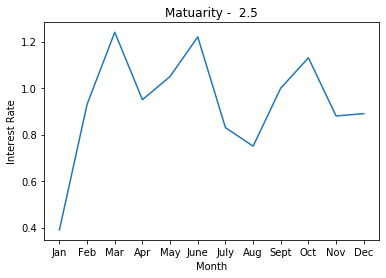

...

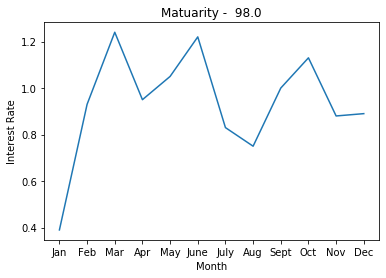

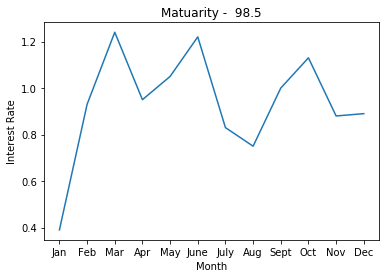

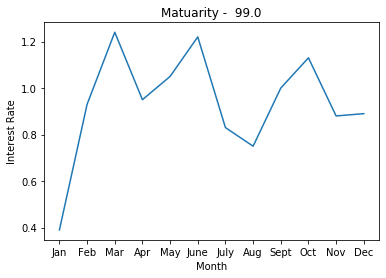

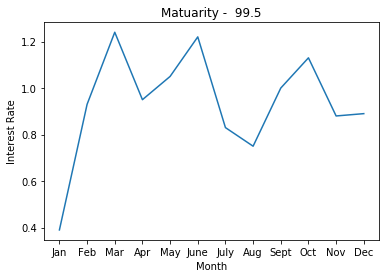

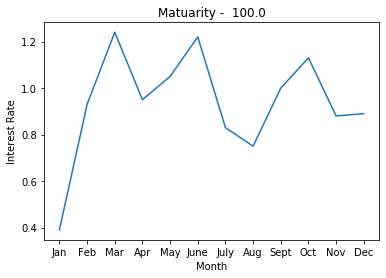

In [59]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

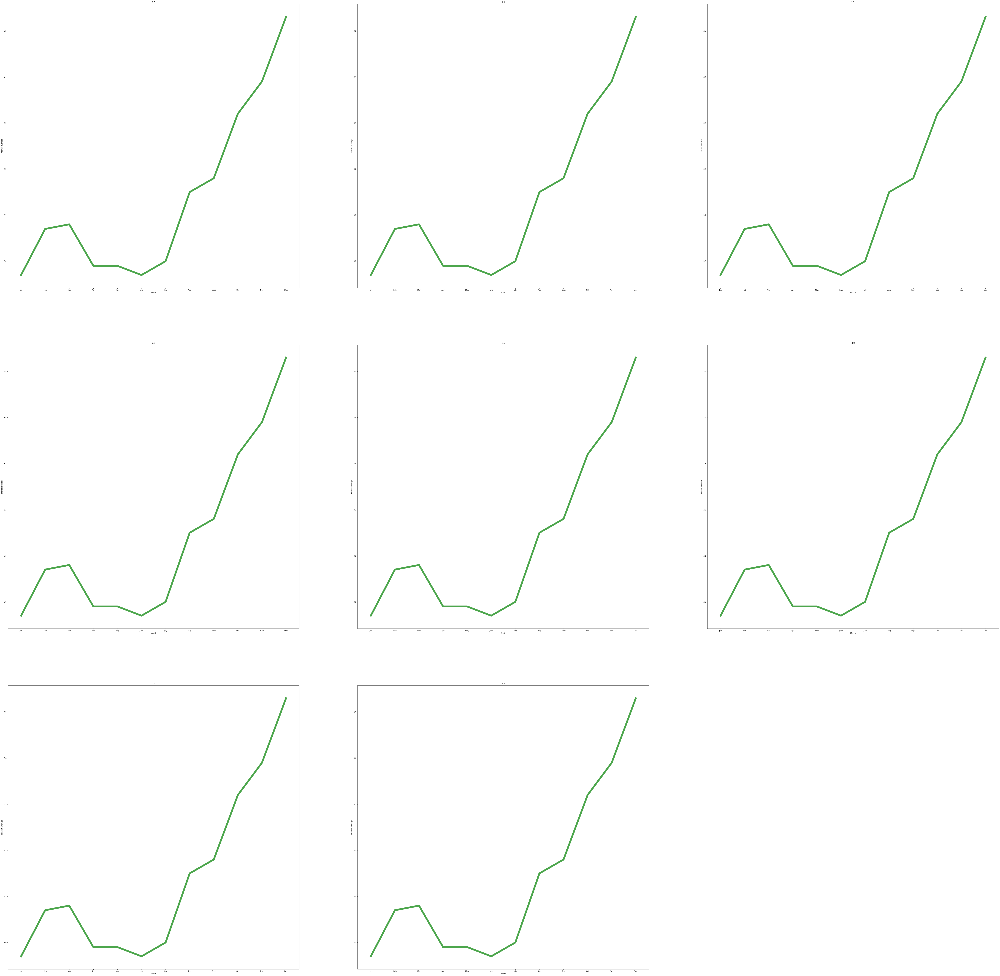

In [137]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

General Best interest in the year of 2003 is in the month of June and lowest in august , safe time is january to march over all trend understanding


In [147]:
df

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec,sum
0,0.5,0.39,0.93,1.24,0.95,1.05,1.22,0.83,0.75,1.00,1.13,0.88,0.89,0.938333
1,1.0,0.52,1.00,1.27,1.01,1.01,1.13,0.87,0.93,1.12,1.25,1.09,1.10,1.025000
2,1.5,0.65,1.08,1.31,1.07,0.99,1.08,0.92,1.10,1.24,1.38,1.29,1.30,1.117500
3,2.0,0.77,1.16,1.36,1.15,1.01,1.06,0.99,1.26,1.35,1.49,1.46,1.47,1.210833
4,2.5,0.89,1.25,1.42,1.23,1.05,1.08,1.09,1.40,1.47,1.61,1.61,1.61,1.309167
5,3.0,1.01,1.35,1.49,1.31,1.11,1.13,1.19,1.53,1.57,1.71,1.73,1.73,1.405000
6,3.5,1.12,1.44,1.56,1.40,1.19,1.19,1.30,1.64,1.67,1.81,1.84,1.83,1.499167
7,4.0,1.23,1.53,1.62,1.48,1.26,1.25,1.41,1.74,1.76,1.89,1.93,1.92,1.585000
8,4.5,1.32,1.61,1.68,1.55,1.33,1.32,1.50,1.83,1.84,1.96,2.01,1.99,1.661667
9,5.0,1.41,1.68,1.73,1.61,1.40,1.38,1.59,1.91,1.91,2.03,2.08,2.06,1.732500


In [146]:
avg_interest_among_all_matuarity = df['sum'].sum()/200

2.795783333333334